In [18]:
# Source - https://stackoverflow.com/a
# Posted by James Errico, modified by community. See post 'Timeline' for change history
# Retrieved 2025-12-26, License - CC BY-SA 4.0

!pip install lxml
!pip install beautifulsoup4
!pip install tqdm
!pip install matplotlib
!pip install opencv-python
# !pip install et


'pip' is not recognized as an internal or external command,
operable program or batch file.
'pip' is not recognized as an internal or external command,
operable program or batch file.
'pip' is not recognized as an internal or external command,
operable program or batch file.
'pip' is not recognized as an internal or external command,
operable program or batch file.
'pip' is not recognized as an internal or external command,
operable program or batch file.


In [19]:
!venv/Scripts\activate

'venv' is not recognized as an internal or external command,
operable program or batch file.


In [20]:
# Immport
from xml.dom import minidom
# import ET

import bs4 as bs
import os
from pathlib import Path
import glob
from tqdm import tqdm
import random
# import cv2
import shutil
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt


In [21]:
# def convertPascal2YOLOv8(filePath):
#
#     class_mapping = {
#         "D00": 0,
#         "D10": 1,
#         "D20": 2,
#         "D40": 3,
#         "D01": 4,
#         "D11": 5,
#         "D43": 6,
#         "D44": 7,
#         "D50": 8
#     }
#
#     # reading content
#     file = open(filePath, "r")
#     contents = file.read()
#
#     # parsing
#     soup = bs.BeautifulSoup(contents, 'html.parser')
#     image_size = soup.find_all("size")[0]
#     image_width = int(image_size.find_all("width")[0].get_text())
#     image_height = int(image_size.find_all("height")[0].get_text())
#     # print("w,h :", image_width, image_height)
#
#     # Process Bounding Box
#     objects = soup.find_all("object")
#
#     # Placeholder
#     bounding_box_list = []
#     class_list = []
#
#     for object in objects:
#
#         # Object Class
#         _class = object.find_all("name")[0].get_text()
#
#         # Map the class to int number, if not defined > 10
#         _class = class_mapping.get(_class, 10)
#         class_list.append(_class)
#
#         # Object Bounding Box
#         _xmin = float(object.find_all("xmin")[0].get_text())
#         _ymin = float(object.find_all("ymin")[0].get_text())
#         _xmax = float(object.find_all("xmax")[0].get_text())
#         _ymax = float(object.find_all("ymax")[0].get_text())
#
#         # Convert to YOLOv8 Annotation
#         # class x_center y_center width height
#         w = (_xmax - _xmin)
#         h = (_ymax - _ymin)
#         cx = _xmin + (w/2)
#         cy = _ymin + (h/2)
#
#         # Normalize
#         w = round((w / image_width), 4)
#         h = round((h / image_height), 4)
#         cx = round((cx / image_width), 4)
#         cy = round((cy / image_height), 4)
#
#         _bbox = [cx, cy, w, h]
#
#         # print(_class, cx, cy, w, h)
#
#         bounding_box_list.append(_bbox)
#
#     # Get the filename
#     outputFilename = os.path.split(filePath)[1]
#     outputFilename = outputFilename.replace(".xml", ".txt")
#
#     # Output Path
#     outputDir = Path(filePath).parents[2]
#     outputDir = outputDir / "labels"
#
#     # Check if the directory exists
#     if not os.path.exists(outputDir):
#         os.makedirs(outputDir)
#
#     # Final output path
#     outputPath = outputDir / outputFilename
#     # print(outputPath)
#
#     # Write to .txt file
#     with open(outputPath, 'w') as f:
#         for i in range(len(class_list)):
#
#             # Filter the class, drop unused class
#             # 0: D00 > Longitudinal Crack
#             # 1: D10 > Transverse Crack
#             # 2: D20 > Alligator Crack
#             # 3: D40 > Potholes
#
#             if class_list[i] < 4:
#                 anno = str(class_list[i]) + " " +  str(bounding_box_list[i][0]) + " " +  str(bounding_box_list[i][1]) + " " +  str(bounding_box_list[i][2]) + " " +  str(bounding_box_list[i][3]) + "\n"
#                 f.write(anno)


def convertPascal2YOLOv8(filePath):
    class_mapping = {
        "D00": 0,
        "D10": 1,
        "D20": 2,
        "D40": 3
    }

    with open(filePath) as f:
        soup = bs.BeautifulSoup(f.read(), "xml")

    size = soup.find("size")
    w = int(size.width.text)
    h = int(size.height.text)

    objects = soup.find_all("object")

    outputDir = r"C:\Projects Datasets\RoadDamageDetection\handled_imbalance_processed_data\labels"
    os.makedirs(outputDir, exist_ok=True)

    outputFile = os.path.join(
        outputDir,
        os.path.basename(filePath).replace(".xml", ".txt")
    )

    lines = []

    for obj in objects:
        name = obj.find("name").text
        if name not in class_mapping:
            continue

        cls = class_mapping[name]
        box = obj.find("bndbox")

        xmin = float(box.xmin.text)
        ymin = float(box.ymin.text)
        xmax = float(box.xmax.text)
        ymax = float(box.ymax.text)

        cx = ((xmin + xmax) / 2) / w
        cy = ((ymin + ymax) / 2) / h
        bw = (xmax - xmin) / w
        bh = (ymax - ymin) / h

        lines.append(f"{cls} {cx:.6f} {cy:.6f} {bw:.6f} {bh:.6f}")

    if lines:
        with open(outputFile, "w") as f:
            f.write("\n".join(lines))


In [22]:
# Dataset Root Directory

# Base Directory
  # "C:\Projects Datasets\RoadDamageDetection\\train\India\\annotations\\xmls",
CountryListDir = ["C:\Projects Datasets\RoadDamageDetection\handled_imbalance_processed_data\\annotations"]

for CountryDir in CountryListDir:
    
    CountryDir =  CountryDir
    fileList = sorted(glob.glob(CountryDir + "/*.xml"))

    # Processing all the annotation
    for file in tqdm(fileList):
        convertPascal2YOLOv8(file)
        # break

100%|██████████| 979/979 [00:00<00:00, 979.52it/s] 


In [23]:
def CopyDatasetSplit(baseDir):
    
    # Split the training data to train and validation data due to lack of annotation on test data
    # Seed
    random.seed(1337)
    
    # Output Directory
    # !!! Change this to your clone folder
    baseOutputDir ="C:\Projects Datasets\RoadDamageDetection\handled_imbalance_processed_data\YOLOv8\\"
    countryName = Path(baseDir).parents[0]
    countryName = os.path.split(countryName)[1]

    baseImageDir = baseDir + "images/"
    baseAnnotDir = baseDir + "labels/"

    image_list_all = sorted(glob.glob(baseImageDir + "/*"))
    annot_list_all = sorted(glob.glob(baseAnnotDir + "/*"))

    # Drop any images that doesnt have annotation (background)
    # Or just leave it at some percentage of the dataset
    backgroundImages_Percentage = 0.1
    image_list = []
    annot_list = []
    
    dataset_length_all = len(image_list_all)
    max_background_image = int(dataset_length_all*backgroundImages_Percentage)
    _counter = 0

    for i in range(len(annot_list_all)):
        
        with open(annot_list_all[i]) as f:
            _annot = f.read()

            # Annotation not empty
            if _annot:
                image_list.append(image_list_all[i])
                annot_list.append(annot_list_all[i])
            elif _counter < max_background_image:
                image_list.append(image_list_all[i])
                annot_list.append(annot_list_all[i])
                _counter = _counter + 1
                
    # Dataset length
    dataset_length = len(image_list)
    # print(dataset_length, len(annot_list))

    split_ratio = 0.85
    middle_point = round(split_ratio * dataset_length)

    # Create random list number using seed
    numberList = list(range(0, dataset_length))
    random.shuffle(numberList)
    trainNumberList = numberList[:middle_point]
    validNumberList = numberList[middle_point:]
    print("Training/Validation Samples :", len(trainNumberList), len(validNumberList))

    # Training images and labels
    print("Copying training images and labels for", countryName)
    for i in tqdm(trainNumberList):

        # Images
        outputImagesDir = baseOutputDir + countryName + "/images/train/"
        if not os.path.exists(outputImagesDir):
            os.makedirs(outputImagesDir)

        shutil.copy2(image_list[i], outputImagesDir)

        # Annotations
        outputAnnotDir = baseOutputDir + countryName + "/labels/train/"
        if not os.path.exists(outputAnnotDir):
            os.makedirs(outputAnnotDir)

        shutil.copy2(annot_list[i], outputAnnotDir)
        # print(outputImagesDir, outputAnnotDir)

    # Validation images and labels
    print("Copying validation images and labels for", countryName)
    for i in tqdm(validNumberList):

        # Images
        outputImagesDir = baseOutputDir + countryName + "/images/val/"
        if not os.path.exists(outputImagesDir):
            os.makedirs(outputImagesDir)

        shutil.copy2(image_list[i], outputImagesDir)

        # Annotations
        outputAnnotDir = baseOutputDir + countryName + "/labels/val/"
        if not os.path.exists(outputAnnotDir):
            os.makedirs(outputAnnotDir)

        shutil.copy2(annot_list[i], outputAnnotDir)
        # print(outputImagesDir, outputAnnotDir)

# baseDir = "../dataset/RDD2022/RDD2022_all_countries/Japan/train/"
# CopyDatasetSplit(baseDir)


In [24]:
# Base Directory


# Use only japan india
CountryListDir = ["C:\Projects Datasets\RoadDamageDetection\handled_imbalance_processed_data\\",
                  # "C:/Projects Datasets/RoadDamageDetection/train/India/",

                #   "RDD2022_all_countries/China_Drone/train/",
                #   "RDD2022_all_countries/China_MotorBike/train/",
                #   "RDD2022/RDD2022_all_countries/Czech/train/",
                #   "RDD2022/RDD2022_all_countries/Norway/Norway/train/",
                #   "RDD2022/RDD2022_all_countries/United_States/United_States/train/",
]

for CountryDir in CountryListDir:
    CountryDir =CountryDir
    CopyDatasetSplit(CountryDir)

Training/Validation Samples : 511 90
Copying training images and labels for RoadDamageDetection


100%|██████████| 511/511 [00:01<00:00, 506.85it/s]


Copying validation images and labels for RoadDamageDetection


100%|██████████| 90/90 [00:00<00:00, 606.32it/s]


In [25]:
!tree ./ -d

Too many parameters - -d


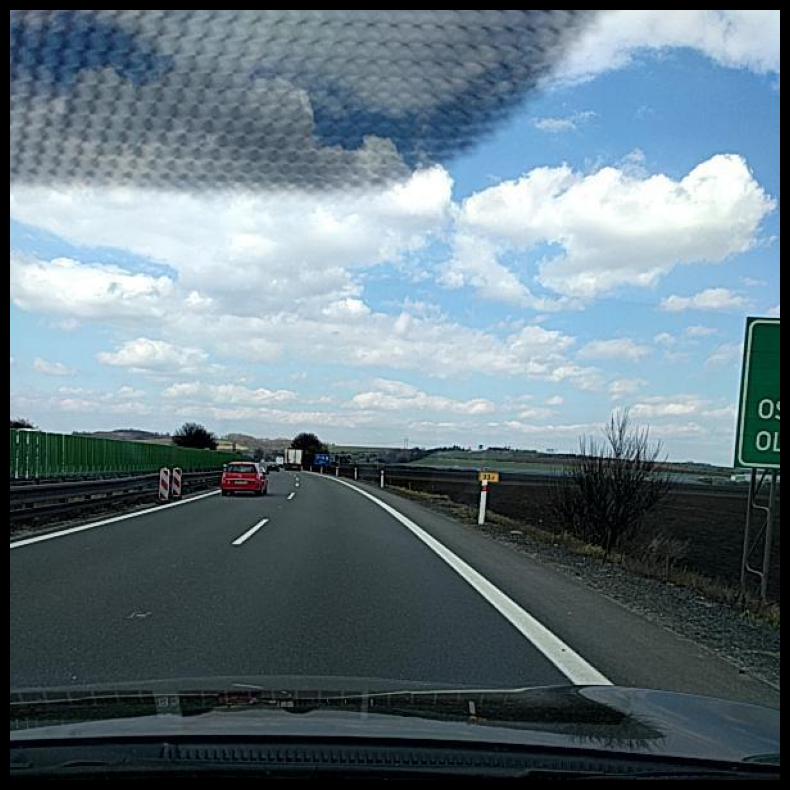

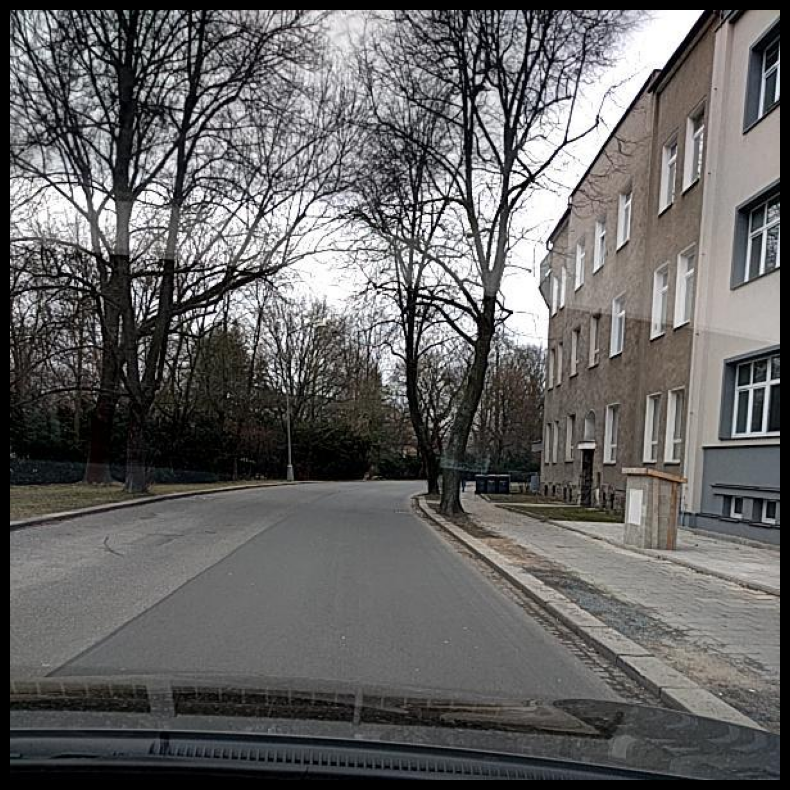

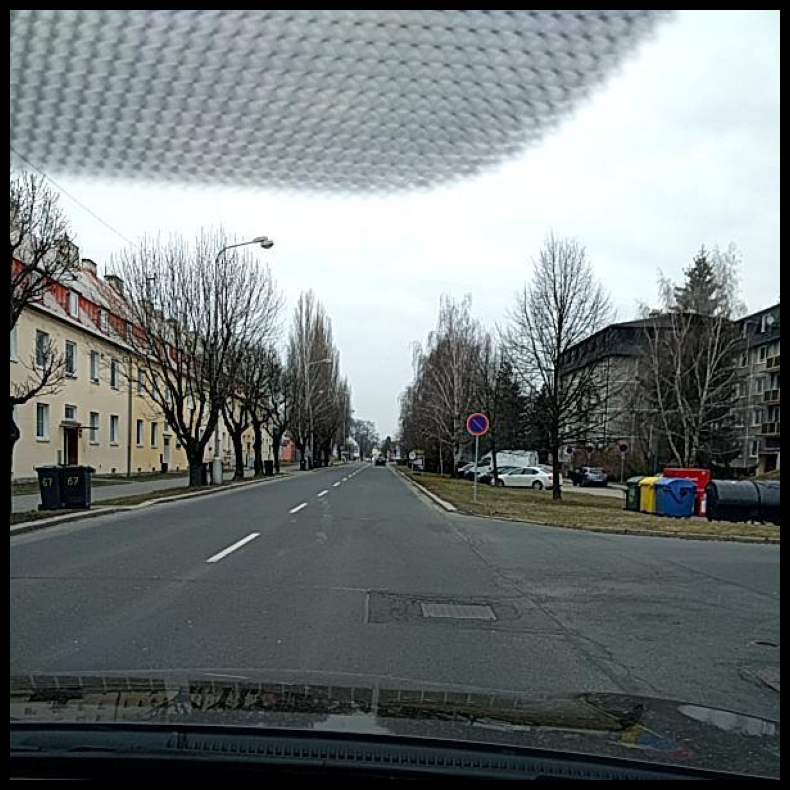

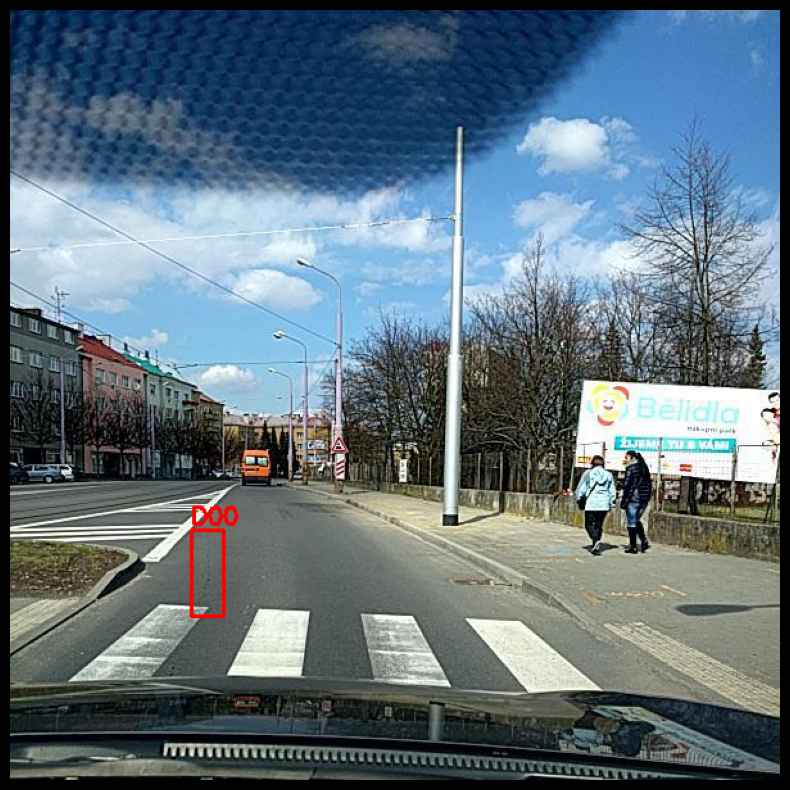

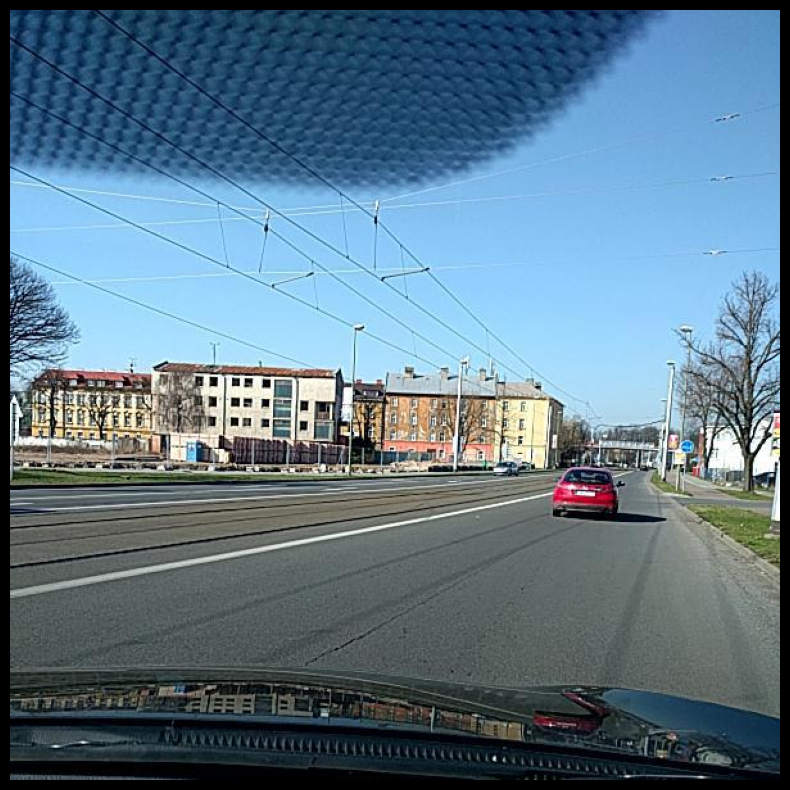

...

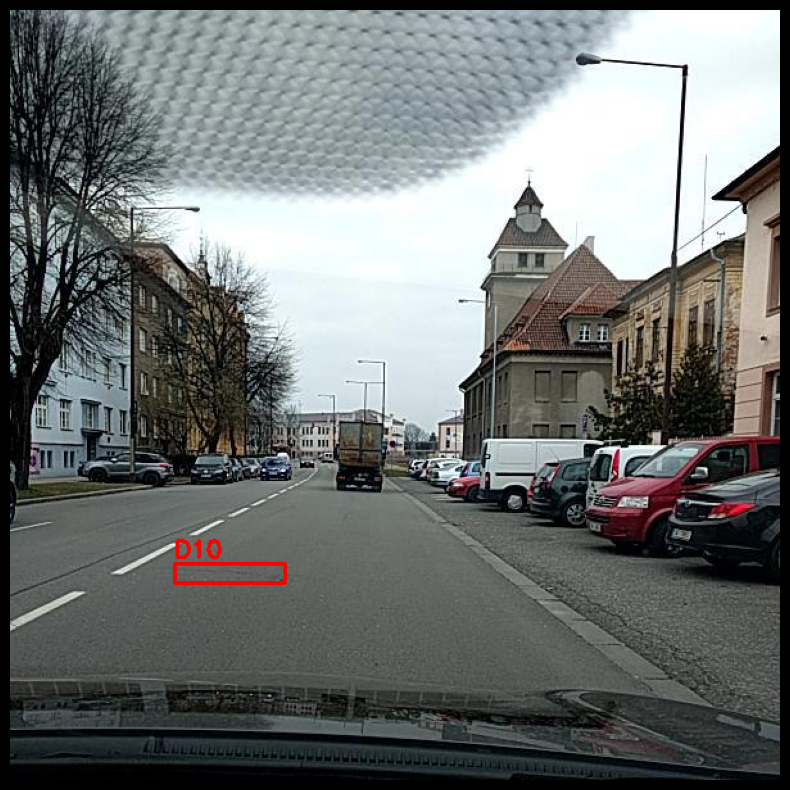

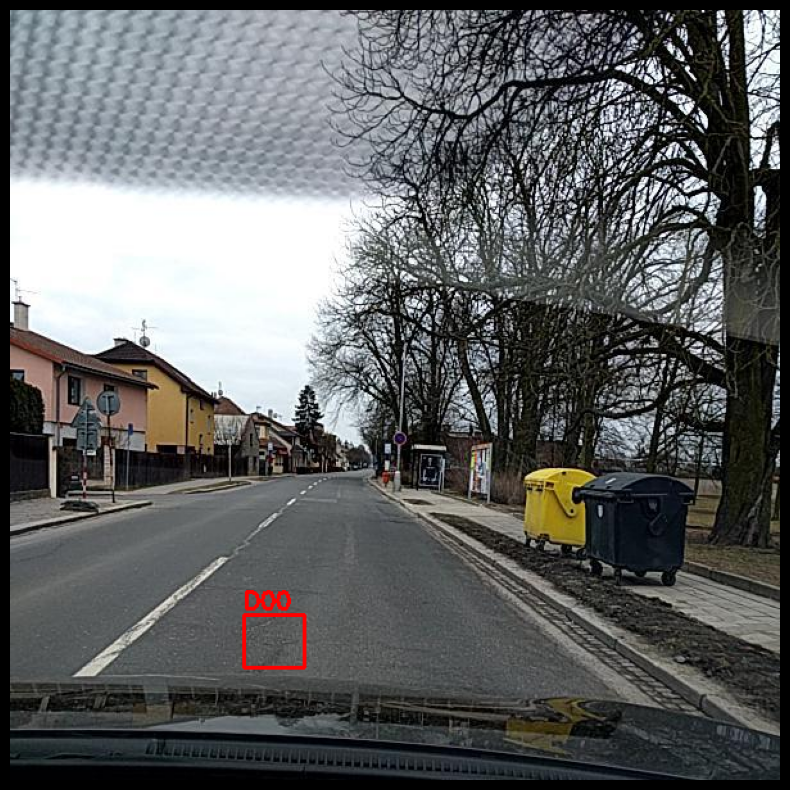

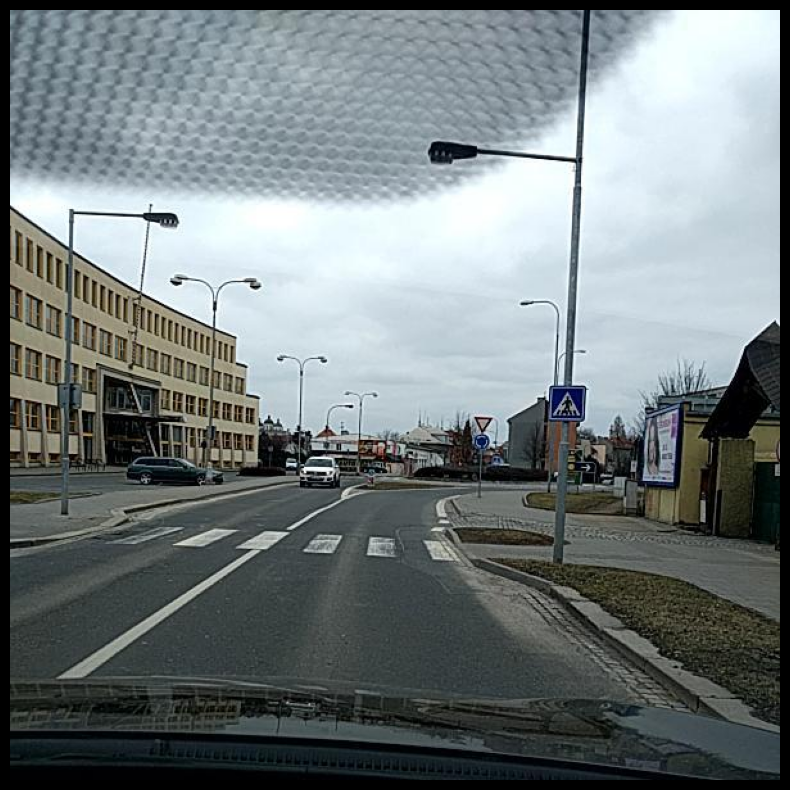

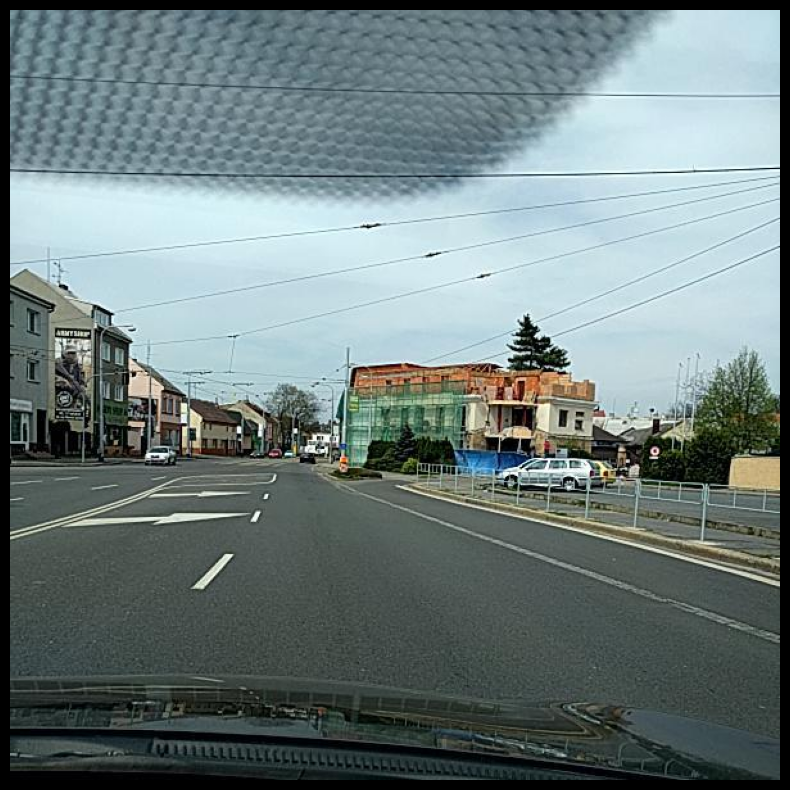

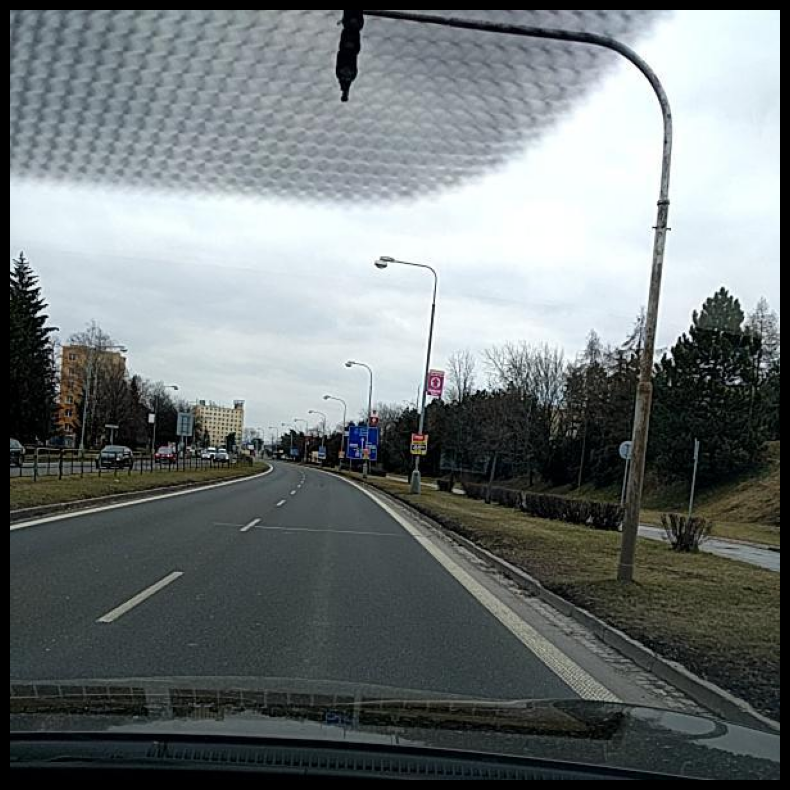

In [26]:
import cv2
import xml.etree.ElementTree as ET

base_path = "C:\Projects Datasets\RoadDamageDetection\preprocessed_01_01\RoadDamageDetection"
 
img_dir = os.path.join(base_path, "images/train")
anno_dir = os.path.join(base_path, "labels/train")

def draw_annotations(image_path, annotation_path):
    # Load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Parse XML
    tree = ET.parse(annotation_path)
    root = tree.getroot()

    # Loop through all objects in the annotation
    for obj in root.findall("object"):
        label = obj.find("name").text
        bbox = obj.find("bndbox")
        xmin = int(bbox.find("xmin").text)
        ymin = int(bbox.find("ymin").text)
        xmax = int(bbox.find("xmax").text)
        ymax = int(bbox.find("ymax").text)

        # Draw bounding box
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (255,0,0), 2)
        cv2.putText(img, label, (xmin, ymin-5), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, (255,0,0), 2)

    return img

# Show a few samples
sample_images = os.listdir(img_dir)[:20]  # first 5 images
for i,img_file in enumerate(sample_images):
    image_path = os.path.join(img_dir, img_file)
    anno_path = os.path.join(anno_dir, os.path.splitext(img_file)[0] + ".xml")

    if os.path.exists(anno_path):
        annotated_img = draw_annotations(image_path, anno_path)
        plt.figure(figsize=(10,10))
        plt.imshow(annotated_img)
        plt.axis("off")
        plt.show()
#
 

In [27]:
sample_images


['Czech_000000.jpg',
 'Czech_000001.jpg',
 'Czech_000002.jpg',
 'Czech_000006.jpg',
 'Czech_000007.jpg',
 'Czech_000009.jpg',
 'Czech_000010.jpg',
 'Czech_000011.jpg',
 'Czech_000012.jpg',
 'Czech_000013.jpg',
 'Czech_000014.jpg',
 'Czech_000015.jpg',
 'Czech_000017.jpg',
 'Czech_000018.jpg',
 'Czech_000020.jpg',
 'Czech_000021.jpg',
 'Czech_000022.jpg',
 'Czech_000024.jpg',
 'Czech_000025.jpg',
 'Czech_000027.jpg']